/tmp/ipykernel_4016270/3050646351.py:173: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
/tmp/ipykernel

Pre-trained VAE models loaded and frozen.
Generating overfit dataset from 5 fixed pairs...


Processing pairs: 100%|██████████| 5/5 [00:10<00:00,  2.13s/it]


Dataset generated. Input shape: torch.Size([500, 513]), Target shape: torch.Size([500, 1, 16, 16])

Starting overfitting training for 500 epochs...


Epoch 50/500: 100%|██████████| 5/5 [00:00<00:00, 197.31it/s, Loss=0.119]


Epoch [50/500] - Average Loss: 0.14142569


Epoch 100/500: 100%|██████████| 5/5 [00:00<00:00, 206.15it/s, Loss=0.129]


Epoch [100/500] - Average Loss: 0.13087180


Epoch 150/500: 100%|██████████| 5/5 [00:00<00:00, 198.51it/s, Loss=0.00506]


Epoch [150/500] - Average Loss: 0.00494287


Epoch 200/500: 100%|██████████| 5/5 [00:00<00:00, 202.18it/s, Loss=0.00412]


Epoch [200/500] - Average Loss: 0.00390140


Epoch 250/500: 100%|██████████| 5/5 [00:00<00:00, 115.69it/s, Loss=0.00397]


Epoch [250/500] - Average Loss: 0.00396105


Epoch 300/500: 100%|██████████| 5/5 [00:00<00:00, 118.75it/s, Loss=0.00254]


Epoch [300/500] - Average Loss: 0.00242799


Epoch 350/500: 100%|██████████| 5/5 [00:00<00:00, 116.15it/s, Loss=0.00173]


Epoch [350/500] - Average Loss: 0.00189429


Epoch 400/500: 100%|██████████| 5/5 [00:00<00:00, 205.02it/s, Loss=0.00168]


Epoch [400/500] - Average Loss: 0.00175773


Epoch 450/500: 100%|██████████| 5/5 [00:00<00:00, 220.47it/s, Loss=0.00152]


Epoch [450/500] - Average Loss: 0.00139476


Epoch 500/500: 100%|██████████| 5/5 [00:00<00:00, 115.56it/s, Loss=0.00132]
/tmp/ipykernel_4016270/3050646351.py:236: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  final_net

Epoch [500/500] - Average Loss: 0.00132834

Overfitting training finished. Best loss: 0.00131276
Model saved to /home/nas/data/YMG/superdeep_ae/보간넷실험02_과적합테스트/interpolation_net_overfit_best.pth

--- Testing the overfitted network ---


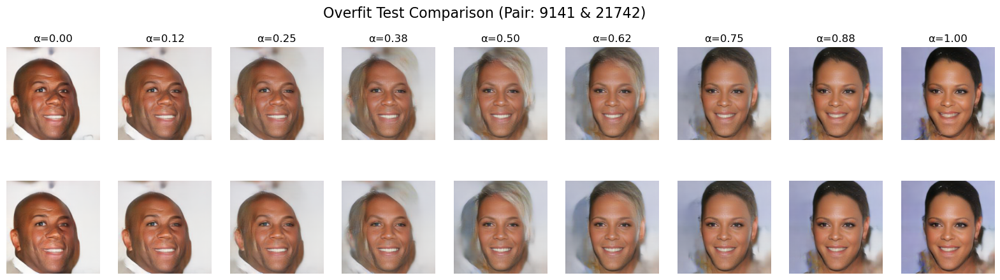

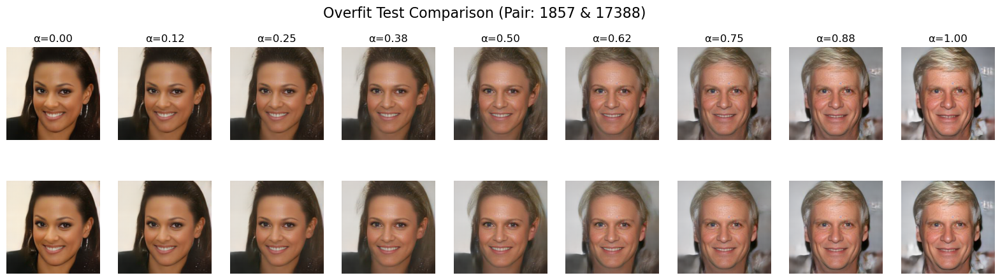

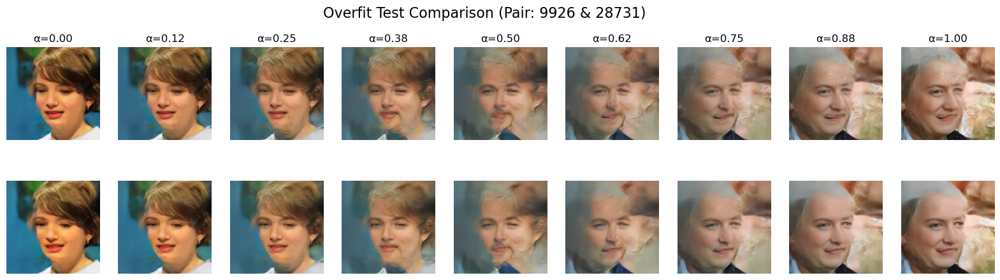

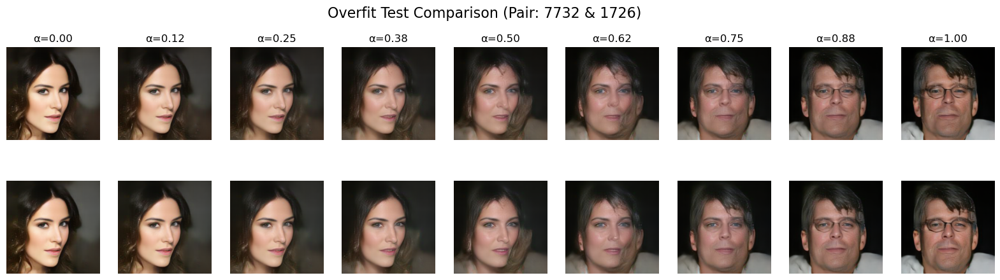

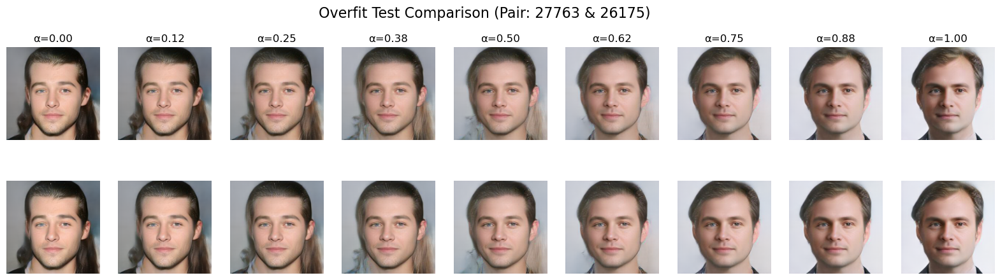

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset
import numpy as np
from tqdm import tqdm
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

# --- 1. 설정 (Settings) ---
DEVICE = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
AE_CHECKPOINT_DIR = '/home/nas/data/YMG/superdeep_ae/checkpoints/'
ENCODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'encoder_superdeep_best.pth')
DECODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'decoder_superdeep_best.pth')

# 원본 이미지를 불러올 경로
DATA_DIR = '/home/nas/data/YMG/datas/celeba_hq_256/'

# 학습된 보간 네트워크(과적합 테스트용)를 저장할 경로
SAVE_DIR = '/home/nas/data/YMG/superdeep_ae/보간넷실험02_과적합테스트/'
os.makedirs(SAVE_DIR, exist_ok=True)
SAVE_PATH = os.path.join(SAVE_DIR, 'interpolation_net_overfit_best.pth')

# 테스트에 고정적으로 사용할 이미지 쌍 인덱스
FIXED_PAIRS_INDICES = [
    (9141, 21742),
    (1857, 17388),
    (9926, 28731),
    (7732, 1726),
    (27763, 26175)
]
NUM_POINTS_PER_PAIR = 100 # 쌍당 생성할 보간점 개수

# 하이퍼파라미터
LATENT_DIM = 256
LEARNING_RATE = 1e-4
BATCH_SIZE = 100 
NUM_EPOCHS = 500 # 과적합을 위해 충분히 많이 학습

# --- 2. 모델 및 헬퍼 함수 정의 ---
class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(nn.Conv2d(in_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels), nn.SiLU(), nn.Conv2d(out_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels))
        self.shortcut = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()
        self.silu = nn.SiLU()
    def forward(self, x): return self.silu(self.block(x) + self.shortcut(x))

class EncoderSuperDeep(nn.Module):
    def __init__(self, in_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.encoder = nn.Sequential(nn.Conv2d(in_channels, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, base_channels*2, 3, 2, 1), ResBlock(base_channels*2, base_channels*2), nn.Conv2d(base_channels*2, base_channels*4, 3, 2, 1), ResBlock(base_channels*4, base_channels*4), nn.Conv2d(base_channels*4, base_channels*8, 3, 2, 1), ResBlock(base_channels*8, base_channels*8), nn.Conv2d(base_channels*8, base_channels*16, 3, 2, 1), ResBlock(base_channels*16, base_channels*16), nn.Conv2d(base_channels*16, 2 * latent_channels, 3, 1, 1))
    def forward(self, x):
        x = self.encoder(x)
        mu, log_var = torch.chunk(x, 2, dim=1)
        return mu, log_var

class DecoderSuperDeep(nn.Module):
    def __init__(self, out_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.decoder = nn.Sequential(nn.Conv2d(latent_channels, base_channels*16, 3, 1, 1), ResBlock(base_channels*16, base_channels*16), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*16, base_channels*8, 3, 1, 1), ResBlock(base_channels*8, base_channels*8), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*8, base_channels*4, 3, 1, 1), ResBlock(base_channels*4, base_channels*4), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*4, base_channels*2, 3, 1, 1), ResBlock(base_channels*2, base_channels*2), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*2, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, out_channels, 3, 1, 1), nn.Tanh())
    def forward(self, z): return self.decoder(z)

class InterpolationNet(nn.Module):
    def __init__(self, latent_dim=LATENT_DIM, hidden_dim=1024):
        super().__init__()
        input_dim = latent_dim * 2 + 1
        self.network = nn.Sequential(
            nn.Linear(input_dim, hidden_dim), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(hidden_dim, hidden_dim), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(hidden_dim, hidden_dim // 2), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(hidden_dim // 2, latent_dim)
        )
    def forward(self, z_a, z_b, alpha):
        net_input = torch.cat([z_a, z_b, alpha], dim=1)
        return self.network(net_input)

class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.paths = sorted([os.path.join(root_dir, f) for f in os.listdir(root_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))])
        self.transform = transform
    def __len__(self): return len(self.paths)
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        if self.transform: img = self.transform(img)
        return img

def denormalize(tensor):
    return (tensor.clamp(-1, 1) * 0.5) + 0.5

# --- 3. 핵심 로직: 데이터 생성, 훈련, 테스트 ---

def generate_overfit_dataset(fixed_pairs, num_points, encoder, decoder, image_dataset, device):
    print(f"Generating overfit dataset from {len(fixed_pairs)} fixed pairs...")
    all_net_inputs = []
    all_z_hat_targets = []

    for start_idx, end_idx in tqdm(fixed_pairs, desc="Processing pairs"):
        img_a = image_dataset[start_idx].unsqueeze(0).to(device)
        img_b = image_dataset[end_idx].unsqueeze(0).to(device)

        with torch.no_grad():
            mu_a, _ = encoder(img_a)
            mu_b, _ = encoder(img_b)

        alphas = torch.linspace(0.01, 0.99, num_points).to(device)
        
        for alpha in alphas:
            # 1. 선형 보간 벡터 z_new 생성
            z_new = (1 - alpha) * mu_a + alpha * mu_b
            
            # 2. z_new를 재투영하여 '정답' z_hat_new 생성
            with torch.no_grad():
                decoded_img = decoder(z_new)
                z_hat_new, _ = encoder(decoded_img)

            # 3. 네트워크 입력 (zA, zB, alpha)과 정답 (z_hat_new)을 저장
            net_input = torch.cat([mu_a.view(1, -1), mu_b.view(1, -1), torch.tensor([[alpha]], device=device)], dim=1)
            all_net_inputs.append(net_input)
            all_z_hat_targets.append(z_hat_new)
        

    train_inputs = torch.cat(all_net_inputs, dim=0)
    train_targets = torch.cat(all_z_hat_targets, dim=0)
    
    print(f"Dataset generated. Input shape: {train_inputs.shape}, Target shape: {train_targets.shape}")
    return train_inputs, train_targets

def test_overfit_network(net, fixed_pairs, encoder, decoder, image_dataset, device):
    print("\n--- Testing the overfitted network ---")
    net.eval()
    
    for _, (start_idx, end_idx) in enumerate(fixed_pairs):
        num_steps = 9
        alphas = torch.linspace(0, 1, num_steps)

        img_a_orig = image_dataset[start_idx]
        img_b_orig = image_dataset[end_idx]
        with torch.no_grad():
            mu_a, _ = encoder(img_a_orig.unsqueeze(0).to(device))
            mu_b, _ = encoder(img_b_orig.unsqueeze(0).to(device))

        lerp_latents = torch.cat([(1 - alpha) * mu_a + alpha * mu_b for alpha in alphas], dim=0)
        
        network_latents = []
        with torch.no_grad():
            for alpha in alphas:
                # 훈련된 네트워크를 사용하여 보간 벡터 예측
                inter_latent_flat = net(mu_a.view(1,-1), mu_b.view(1,-1), torch.tensor([[alpha]], device=device))
                network_latents.append(inter_latent_flat.view(1, 1, 16, 16))
        network_latents = torch.cat(network_latents, dim=0)

        with torch.no_grad():
            lerp_images = decoder(lerp_latents).cpu()
            network_images = decoder(network_latents).cpu()

        fig, axes = plt.subplots(2, num_steps, figsize=(20, 5))
        fig.suptitle(f"Overfit Test Comparison (Pair: {start_idx} & {end_idx})", fontsize=16)
        axes[0, 0].set_ylabel("Linear (Lerp)", fontsize=12)
        axes[1, 0].set_ylabel("Overfitted Network", fontsize=12)

        for j in range(num_steps):
            axes[0, j].imshow(denormalize(lerp_images[j]).permute(1, 2, 0)); axes[0, j].axis('off')
            axes[1, j].imshow(denormalize(network_images[j]).permute(1, 2, 0)); axes[1, j].axis('off')
            axes[0, j].set_title(f"α={alphas[j]:.2f}")
        plt.show()

def main():
    # --- VAE 모델 로드 및 동결 ---
    encoder = EncoderSuperDeep().to(DEVICE); encoder.eval()
    decoder = DecoderSuperDeep().to(DEVICE); decoder.eval()
    encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
    decoder.load_state_dict(torch.load(DECODER_PATH, map_location=DEVICE))
    for param in encoder.parameters(): param.requires_grad = False
    for param in decoder.parameters(): param.requires_grad = False
    print("Pre-trained VAE models loaded and frozen.")
    
    transform = transforms.Compose([transforms.Resize((256, 256)), transforms.ToTensor(), transforms.Normalize(mean=[0.5], std=[0.5])])
    full_image_dataset = CustomImageDataset(DATA_DIR, transform)

    # --- 1단계: 과적합용 데이터셋 생성 ---
    train_inputs, train_targets = generate_overfit_dataset(
        fixed_pairs=FIXED_PAIRS_INDICES, 
        num_points=NUM_POINTS_PER_PAIR, 
        encoder=encoder, 
        decoder=decoder, 
        image_dataset=full_image_dataset, 
        device=DEVICE
    )
    
    overfit_dataset = TensorDataset(train_inputs, train_targets.view(-1, LATENT_DIM))
    overfit_dataloader = DataLoader(overfit_dataset, batch_size=BATCH_SIZE, shuffle=True)

    # --- 2단계: 과적합 훈련 ---
    interpolation_net = InterpolationNet().to(DEVICE)
    optimizer = optim.Adam(interpolation_net.parameters(), lr=LEARNING_RATE)
    loss_fn = nn.MSELoss() # 단순 MSE로 '정답' 암기
    best_loss = float('inf')

    print(f"\nStarting overfitting training for {NUM_EPOCHS} epochs...")
    for epoch in range(NUM_EPOCHS):
        interpolation_net.train()
        epoch_loss = 0
        pbar = tqdm(overfit_dataloader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS}")
        for net_input_batch, target_z_hat_batch in pbar:
            optimizer.zero_grad()
            
            # 네트워크 입력 분리
            z_a = net_input_batch[:, :LATENT_DIM]
            z_b = net_input_batch[:, LATENT_DIM:LATENT_DIM*2]
            alpha = net_input_batch[:, -1].unsqueeze(1)
            
            # 예측 및 손실 계산
            predicted_z_flat = interpolation_net(z_a, z_b, alpha)
            loss = loss_fn(predicted_z_flat, target_z_hat_batch)
            
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
            pbar.set_postfix({"Loss": loss.item()})
        
        avg_loss = epoch_loss / len(overfit_dataloader)
        if (epoch + 1) % 50 == 0:
            print(f"Epoch [{epoch+1}/{NUM_EPOCHS}] - Average Loss: {avg_loss:.8f}")

        if avg_loss < best_loss:
            best_loss = avg_loss
            torch.save(interpolation_net.state_dict(), SAVE_PATH)

    print(f"\nOverfitting training finished. Best loss: {best_loss:.8f}")
    print(f"Model saved to {SAVE_PATH}")
    
    # --- 3단계: 훈련된 네트워크 테스트 및 시각화 ---
    final_net = InterpolationNet().to(DEVICE)
    final_net.load_state_dict(torch.load(SAVE_PATH, map_location=DEVICE))
    test_overfit_network(final_net, FIXED_PAIRS_INDICES, encoder, decoder, full_image_dataset, DEVICE)

if __name__ == '__main__':
    main()

/tmp/ipykernel_4023864/646095509.py:238: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
/tmp/ipykernel_

Pre-trained VAE models loaded and frozen.
Generating overfit dataset from 5 fixed pairs...


Processing pairs: 100%|██████████| 5/5 [00:06<00:00,  1.33s/it]


Dataset generated. Input shape: torch.Size([500, 513]), Target shape: torch.Size([500, 1, 16, 16])

[DIAGNOSIS] Initial MSE between z_new and z_hat_new: 0.02270016

Starting overfitting training for 500 epochs...


Epoch 50/500: 100%|██████████| 5/5 [00:00<00:00, 223.06it/s, Loss=0.136]


Epoch [50/500] - Average Loss: 0.14119566


Epoch 100/500: 100%|██████████| 5/5 [00:00<00:00, 169.95it/s, Loss=0.129]


Epoch [100/500] - Average Loss: 0.12706637


Epoch 150/500: 100%|██████████| 5/5 [00:00<00:00, 111.88it/s, Loss=0.00532]


Epoch [150/500] - Average Loss: 0.00498060


Epoch 200/500: 100%|██████████| 5/5 [00:00<00:00, 160.85it/s, Loss=0.00389]


Epoch [200/500] - Average Loss: 0.00386254


Epoch 250/500: 100%|██████████| 5/5 [00:00<00:00, 166.85it/s, Loss=0.00321]


Epoch [250/500] - Average Loss: 0.00312898


Epoch 300/500: 100%|██████████| 5/5 [00:00<00:00, 217.29it/s, Loss=0.0023]


Epoch [300/500] - Average Loss: 0.00235230


Epoch 350/500: 100%|██████████| 5/5 [00:00<00:00, 214.81it/s, Loss=0.00212]


Epoch [350/500] - Average Loss: 0.00191825


Epoch 400/500: 100%|██████████| 5/5 [00:00<00:00, 153.72it/s, Loss=0.00162]


Epoch [400/500] - Average Loss: 0.00157733


Epoch 450/500: 100%|██████████| 5/5 [00:00<00:00, 162.54it/s, Loss=0.0013]


Epoch [450/500] - Average Loss: 0.00136225


Epoch 500/500: 100%|██████████| 5/5 [00:00<00:00, 119.95it/s, Loss=0.0013]
/tmp/ipykernel_4023864/646095509.py:301: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  final_net.l

Epoch [500/500] - Average Loss: 0.00119127

Overfitting training finished. Best loss: 0.00119127
Model saved to /home/nas/data/YMG/superdeep_ae/보간넷실험02_과적합테스트/interpolation_net_overfit_best.pth

--- Testing the overfitted network ---


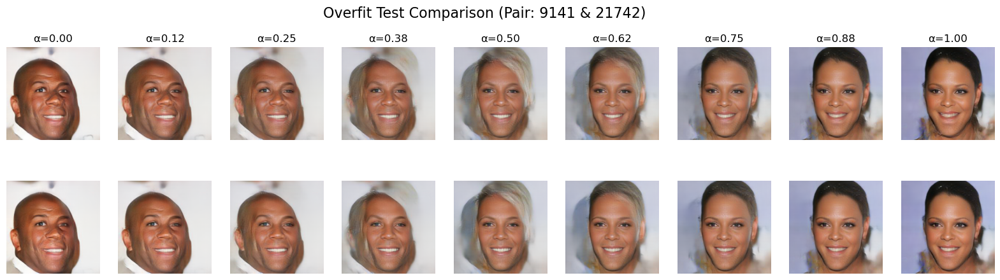

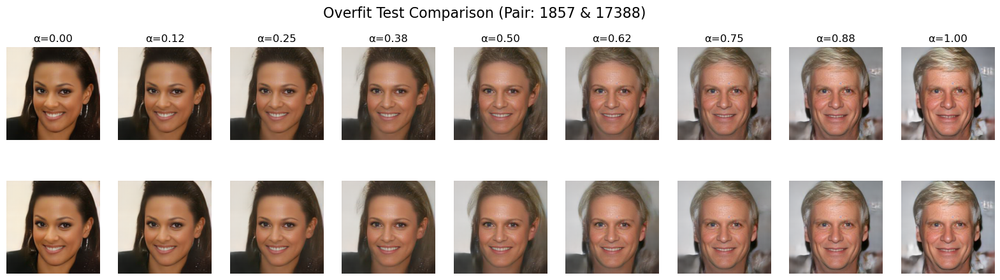

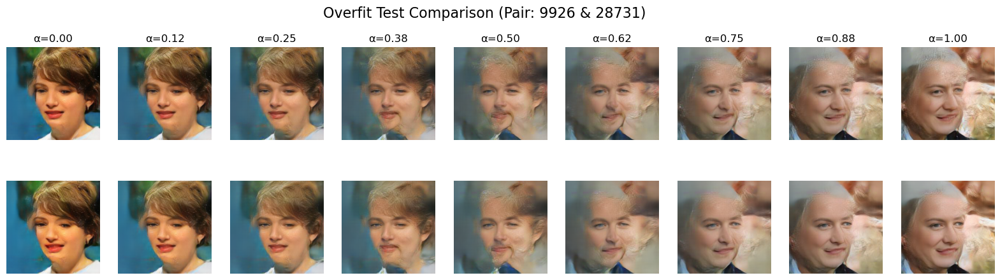

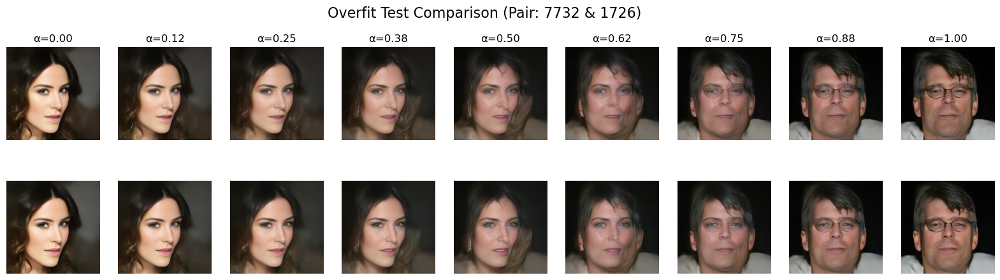

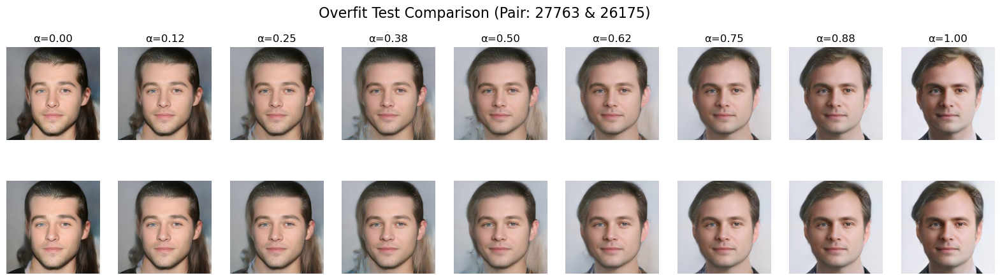


--- Visualizing the Target Path (z_hat_new) vs. Linear Path (z_new) ---


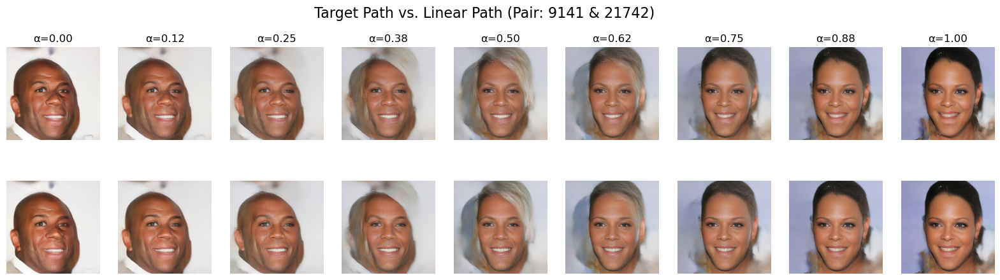

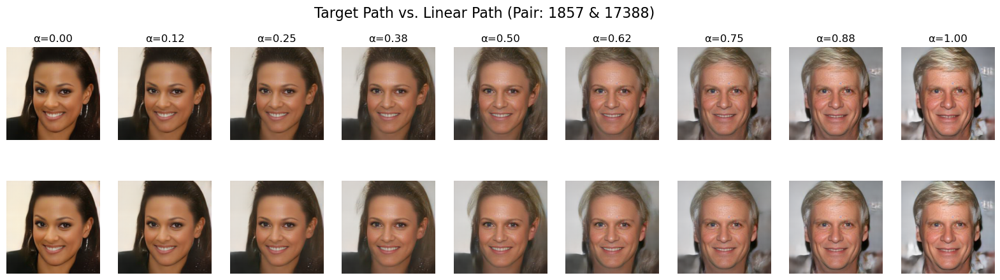

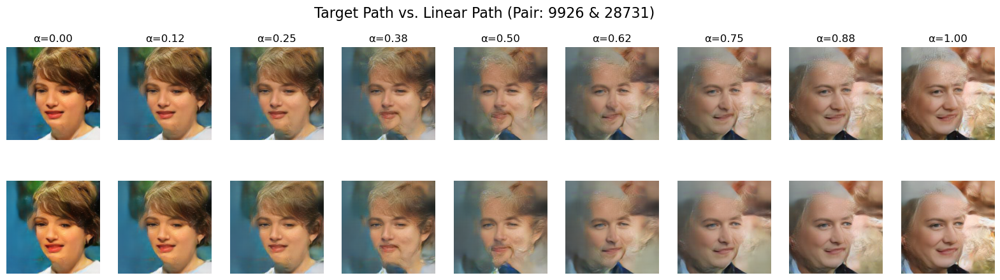

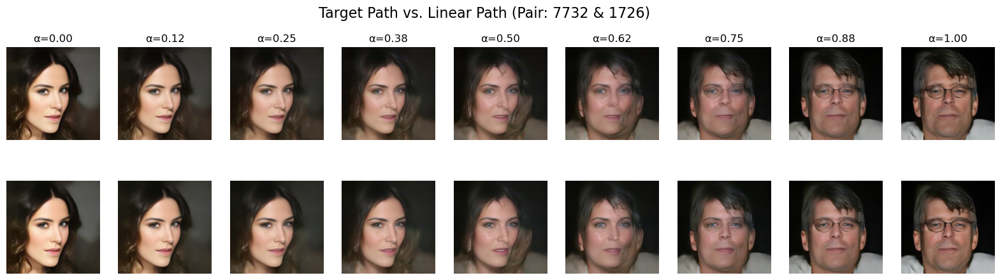

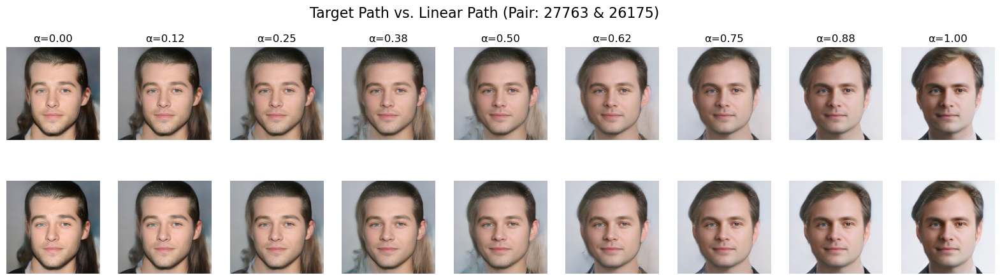

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset
import numpy as np
from tqdm import tqdm
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

# --- 1. 설정 (Settings) ---
DEVICE = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
AE_CHECKPOINT_DIR = '/home/nas/data/YMG/superdeep_ae/checkpoints/'
ENCODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'encoder_superdeep_best.pth')
DECODER_PATH = os.path.join(AE_CHECKPOINT_DIR, 'decoder_superdeep_best.pth')

# 원본 이미지를 불러올 경로
DATA_DIR = '/home/nas/data/YMG/datas/celeba_hq_256/'

# 학습된 보간 네트워크(과적합 테스트용)를 저장할 경로
SAVE_DIR = '/home/nas/data/YMG/superdeep_ae/보간넷실험02_과적합테스트/'
os.makedirs(SAVE_DIR, exist_ok=True)
SAVE_PATH = os.path.join(SAVE_DIR, 'interpolation_net_overfit_best.pth')

# 테스트에 고정적으로 사용할 이미지 쌍 인덱스
FIXED_PAIRS_INDICES = [
    (9141, 21742),
    (1857, 17388),
    (9926, 28731),
    (7732, 1726),
    (27763, 26175)
]
NUM_POINTS_PER_PAIR = 100 # 쌍당 생성할 보간점 개수

# 하이퍼파라미터
LATENT_DIM = 256
LEARNING_RATE = 1e-4
BATCH_SIZE = 100 
NUM_EPOCHS = 500 # 과적합을 위해 충분히 많이 학습

# --- 2. 모델 및 헬퍼 함수 정의 ---
class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(nn.Conv2d(in_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels), nn.SiLU(), nn.Conv2d(out_channels, out_channels, 3, 1, 1), nn.BatchNorm2d(out_channels))
        self.shortcut = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()
        self.silu = nn.SiLU()
    def forward(self, x): return self.silu(self.block(x) + self.shortcut(x))

class EncoderSuperDeep(nn.Module):
    def __init__(self, in_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.encoder = nn.Sequential(nn.Conv2d(in_channels, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, base_channels*2, 3, 2, 1), ResBlock(base_channels*2, base_channels*2), nn.Conv2d(base_channels*2, base_channels*4, 3, 2, 1), ResBlock(base_channels*4, base_channels*4), nn.Conv2d(base_channels*4, base_channels*8, 3, 2, 1), ResBlock(base_channels*8, base_channels*8), nn.Conv2d(base_channels*8, base_channels*16, 3, 2, 1), ResBlock(base_channels*16, base_channels*16), nn.Conv2d(base_channels*16, 2 * latent_channels, 3, 1, 1))
    def forward(self, x):
        x = self.encoder(x)
        mu, log_var = torch.chunk(x, 2, dim=1)
        return mu, log_var

class DecoderSuperDeep(nn.Module):
    def __init__(self, out_channels=3, base_channels=128, latent_channels=1):
        super().__init__()
        self.decoder = nn.Sequential(nn.Conv2d(latent_channels, base_channels*16, 3, 1, 1), ResBlock(base_channels*16, base_channels*16), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*16, base_channels*8, 3, 1, 1), ResBlock(base_channels*8, base_channels*8), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*8, base_channels*4, 3, 1, 1), ResBlock(base_channels*4, base_channels*4), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*4, base_channels*2, 3, 1, 1), ResBlock(base_channels*2, base_channels*2), nn.Upsample(scale_factor=2, mode='nearest'), nn.Conv2d(base_channels*2, base_channels, 3, 1, 1), ResBlock(base_channels, base_channels), nn.Conv2d(base_channels, out_channels, 3, 1, 1), nn.Tanh())
    def forward(self, z): return self.decoder(z)

class InterpolationNet(nn.Module):
    def __init__(self, latent_dim=LATENT_DIM, hidden_dim=1024):
        super().__init__()
        input_dim = latent_dim * 2 + 1
        self.network = nn.Sequential(
            nn.Linear(input_dim, hidden_dim), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(hidden_dim, hidden_dim), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(hidden_dim, hidden_dim // 2), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(hidden_dim // 2, latent_dim)
        )
    def forward(self, z_a, z_b, alpha):
        net_input = torch.cat([z_a, z_b, alpha], dim=1)
        return self.network(net_input)

class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.paths = sorted([os.path.join(root_dir, f) for f in os.listdir(root_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))])
        self.transform = transform
    def __len__(self): return len(self.paths)
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        if self.transform: img = self.transform(img)
        return img

def denormalize(tensor):
    return (tensor.clamp(-1, 1) * 0.5) + 0.5

# --- 3. 핵심 로직: 데이터 생성, 훈련, 테스트 ---

def generate_overfit_dataset(fixed_pairs, num_points, encoder, decoder, image_dataset, device):
    print(f"Generating overfit dataset from {len(fixed_pairs)} fixed pairs...")
    all_net_inputs = []
    all_z_hat_targets = []

    for start_idx, end_idx in tqdm(fixed_pairs, desc="Processing pairs"):
        img_a = image_dataset[start_idx].unsqueeze(0).to(device)
        img_b = image_dataset[end_idx].unsqueeze(0).to(device)

        with torch.no_grad():
            mu_a, _ = encoder(img_a)
            mu_b, _ = encoder(img_b)

        alphas = torch.linspace(0.01, 0.99, num_points).to(device)
        
        for alpha in alphas:
            # 1. 선형 보간 벡터 z_new 생성
            z_new = (1 - alpha) * mu_a + alpha * mu_b
            
            # 2. z_new를 재투영하여 '정답' z_hat_new 생성
            with torch.no_grad():
                decoded_img = decoder(z_new)
                z_hat_new, _ = encoder(decoded_img)

            # 3. 네트워크 입력 (zA, zB, alpha)과 정답 (z_hat_new)을 저장
            net_input = torch.cat([mu_a.view(1, -1), mu_b.view(1, -1), torch.tensor([[alpha]], device=device)], dim=1)
            all_net_inputs.append(net_input)
            all_z_hat_targets.append(z_hat_new)
        

    train_inputs = torch.cat(all_net_inputs, dim=0)
    train_targets = torch.cat(all_z_hat_targets, dim=0)
    
    print(f"Dataset generated. Input shape: {train_inputs.shape}, Target shape: {train_targets.shape}")

    # z_new와 z_hat_new 사이의 평균 오차 계산
    with torch.no_grad():
        all_z_new = []
        # all_net_inputs에서 z_new를 다시 계산해야 함
        for net_input in all_net_inputs:
            mu_a_flat = net_input[:, :LATENT_DIM]
            mu_b_flat = net_input[:, LATENT_DIM:LATENT_DIM*2]
            alpha = net_input[:, -1].unsqueeze(1)
            z_new_flat = (1-alpha)*mu_a_flat + alpha*mu_b_flat
            all_z_new.append(z_new_flat)
            
        all_z_new_tensor = torch.cat(all_z_new, dim=0)
        all_z_hat_targets_flat = train_targets.view(-1, LATENT_DIM)
        
        initial_error = torch.mean((all_z_new_tensor - all_z_hat_targets_flat)**2)
        print(f"\n[DIAGNOSIS] Initial MSE between z_new and z_hat_new: {initial_error.item():.8f}")
    return train_inputs, train_targets

def test_overfit_network(net, fixed_pairs, encoder, decoder, image_dataset, device):
    print("\n--- Testing the overfitted network ---")
    net.eval()
    
    for _, (start_idx, end_idx) in enumerate(fixed_pairs):
        num_steps = 9
        alphas = torch.linspace(0, 1, num_steps)

        img_a_orig = image_dataset[start_idx]
        img_b_orig = image_dataset[end_idx]
        with torch.no_grad():
            mu_a, _ = encoder(img_a_orig.unsqueeze(0).to(device))
            mu_b, _ = encoder(img_b_orig.unsqueeze(0).to(device))

        lerp_latents = torch.cat([(1 - alpha) * mu_a + alpha * mu_b for alpha in alphas], dim=0)
        
        network_latents = []
        with torch.no_grad():
            for alpha in alphas:
                # 훈련된 네트워크를 사용하여 보간 벡터 예측
                inter_latent_flat = net(mu_a.view(1,-1), mu_b.view(1,-1), torch.tensor([[alpha]], device=device))
                network_latents.append(inter_latent_flat.view(1, 1, 16, 16))
        network_latents = torch.cat(network_latents, dim=0)

        with torch.no_grad():
            lerp_images = decoder(lerp_latents).cpu()
            network_images = decoder(network_latents).cpu()

        fig, axes = plt.subplots(2, num_steps, figsize=(20, 5))
        fig.suptitle(f"Overfit Test Comparison (Pair: {start_idx} & {end_idx})", fontsize=16)
        axes[0, 0].set_ylabel("Linear (Lerp)", fontsize=12)
        axes[1, 0].set_ylabel("Overfitted Network", fontsize=12)

        for j in range(num_steps):
            axes[0, j].imshow(denormalize(lerp_images[j]).permute(1, 2, 0)); axes[0, j].axis('off')
            axes[1, j].imshow(denormalize(network_images[j]).permute(1, 2, 0)); axes[1, j].axis('off')
            axes[0, j].set_title(f"α={alphas[j]:.2f}")
        plt.show()

# test_overfit_network 함수를 아래 함수로 교체하여 실행해보세요.
def visualize_target_path(fixed_pairs, encoder, decoder, image_dataset, device):
    print("\n--- Visualizing the Target Path (z_hat_new) vs. Linear Path (z_new) ---")
    
    for _, (start_idx, end_idx) in enumerate(fixed_pairs):
        num_steps = 9
        alphas = torch.linspace(0, 1, num_steps)

        img_a_orig = image_dataset[start_idx]
        img_b_orig = image_dataset[end_idx]
        with torch.no_grad():
            mu_a, _ = encoder(img_a_orig.unsqueeze(0).to(device))
            mu_b, _ = encoder(img_b_orig.unsqueeze(0).to(device))

        linear_latents = []
        target_latents = []
        
        with torch.no_grad():
            for alpha in alphas:
                # 1. 선형 보간 벡터 z_new
                z_new = (1 - alpha) * mu_a + alpha * mu_b
                linear_latents.append(z_new)
                
                # 2. '정답' 재투영 벡터 z_hat_new
                decoded_img = decoder(z_new)
                z_hat_new, _ = encoder(decoded_img)
                target_latents.append(z_hat_new)

        linear_latents = torch.cat(linear_latents, dim=0)
        target_latents = torch.cat(target_latents, dim=0)

        with torch.no_grad():
            linear_images = decoder(linear_latents).cpu()
            target_images = decoder(target_latents).cpu()

        fig, axes = plt.subplots(2, num_steps, figsize=(20, 5))
        fig.suptitle(f"Target Path vs. Linear Path (Pair: {start_idx} & {end_idx})", fontsize=16)
        axes[0, 0].set_ylabel("Linear Path (D(z_new))", fontsize=12)
        axes[1, 0].set_ylabel("Target Path (D(z_hat_new))", fontsize=12)

        for j in range(num_steps):
            axes[0, j].imshow(denormalize(linear_images[j]).permute(1, 2, 0)); axes[0, j].axis('off')
            axes[1, j].imshow(denormalize(target_images[j]).permute(1, 2, 0)); axes[1, j].axis('off')
            axes[0, j].set_title(f"α={alphas[j]:.2f}")
        plt.show()


def main():
    # --- VAE 모델 로드 및 동결 ---
    encoder = EncoderSuperDeep().to(DEVICE); encoder.eval()
    decoder = DecoderSuperDeep().to(DEVICE); decoder.eval()
    encoder.load_state_dict(torch.load(ENCODER_PATH, map_location=DEVICE))
    decoder.load_state_dict(torch.load(DECODER_PATH, map_location=DEVICE))
    for param in encoder.parameters(): param.requires_grad = False
    for param in decoder.parameters(): param.requires_grad = False
    print("Pre-trained VAE models loaded and frozen.")
    
    transform = transforms.Compose([transforms.Resize((256, 256)), transforms.ToTensor(), transforms.Normalize(mean=[0.5], std=[0.5])])
    full_image_dataset = CustomImageDataset(DATA_DIR, transform)

    # --- 1단계: 과적합용 데이터셋 생성 ---
    train_inputs, train_targets = generate_overfit_dataset(
        fixed_pairs=FIXED_PAIRS_INDICES, 
        num_points=NUM_POINTS_PER_PAIR, 
        encoder=encoder, 
        decoder=decoder, 
        image_dataset=full_image_dataset, 
        device=DEVICE
    )
    
    overfit_dataset = TensorDataset(train_inputs, train_targets.view(-1, LATENT_DIM))
    overfit_dataloader = DataLoader(overfit_dataset, batch_size=BATCH_SIZE, shuffle=True)

    # --- 2단계: 과적합 훈련 ---
    interpolation_net = InterpolationNet().to(DEVICE)
    optimizer = optim.Adam(interpolation_net.parameters(), lr=LEARNING_RATE)
    loss_fn = nn.MSELoss() # 단순 MSE로 '정답' 암기
    best_loss = float('inf')

    print(f"\nStarting overfitting training for {NUM_EPOCHS} epochs...")
    for epoch in range(NUM_EPOCHS):
        interpolation_net.train()
        epoch_loss = 0
        pbar = tqdm(overfit_dataloader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS}")
        for net_input_batch, target_z_hat_batch in pbar:
            optimizer.zero_grad()
            
            # 네트워크 입력 분리
            z_a = net_input_batch[:, :LATENT_DIM]
            z_b = net_input_batch[:, LATENT_DIM:LATENT_DIM*2]
            alpha = net_input_batch[:, -1].unsqueeze(1)
            
            # 예측 및 손실 계산
            predicted_z_flat = interpolation_net(z_a, z_b, alpha)
            loss = loss_fn(predicted_z_flat, target_z_hat_batch)
            
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
            pbar.set_postfix({"Loss": loss.item()})
        
        avg_loss = epoch_loss / len(overfit_dataloader)
        if (epoch + 1) % 50 == 0:
            print(f"Epoch [{epoch+1}/{NUM_EPOCHS}] - Average Loss: {avg_loss:.8f}")

        if avg_loss < best_loss:
            best_loss = avg_loss
            torch.save(interpolation_net.state_dict(), SAVE_PATH)

    print(f"\nOverfitting training finished. Best loss: {best_loss:.8f}")
    print(f"Model saved to {SAVE_PATH}")
    
    # --- 3단계: 훈련된 네트워크 테스트 및 시각화 ---
    final_net = InterpolationNet().to(DEVICE)
    final_net.load_state_dict(torch.load(SAVE_PATH, map_location=DEVICE))
    test_overfit_network(final_net, FIXED_PAIRS_INDICES, encoder, decoder, full_image_dataset, DEVICE)

    visualize_target_path(FIXED_PAIRS_INDICES, encoder, decoder, full_image_dataset, DEVICE)

if __name__ == '__main__':
    main()